BGI Stereoseq analysis for dataset "cDNA5" chip #SS200000579BR_D5

In [1]:
import os, glob
import numpy as np
# import seaborn
import matplotlib.pyplot as plt
from tqdm.notebook import tqdm

# modify path so we can import a custom module
import sys
sys.path.append('.')

from sawg import SpotTable

In [2]:
%load_ext autoreload
%autoreload 2

The autoreload module is not an IPython extension.


UsageError: Line magic function `%autoreload` not found.


In [4]:
data_path= '../../../data/BGI_data/cDNA5/'
gem_file = data_path + 'macaque-lasso.gem'
cache_file = data_path + 'macaque-lasso.npz'
table = SpotTable.load_stereoseq(gem_file, cache_file)

Loading from npz..


In [4]:
print(data.shape)
print(len(genes))

(73512984,)
16036


In [5]:
sub = table.get_subregion(xlim=(12000, 14000), ylim=(15000, 17000))

In [146]:
#sub = table.get_subregion(xlim=(9000, 15000), ylim=(14000, 22000))

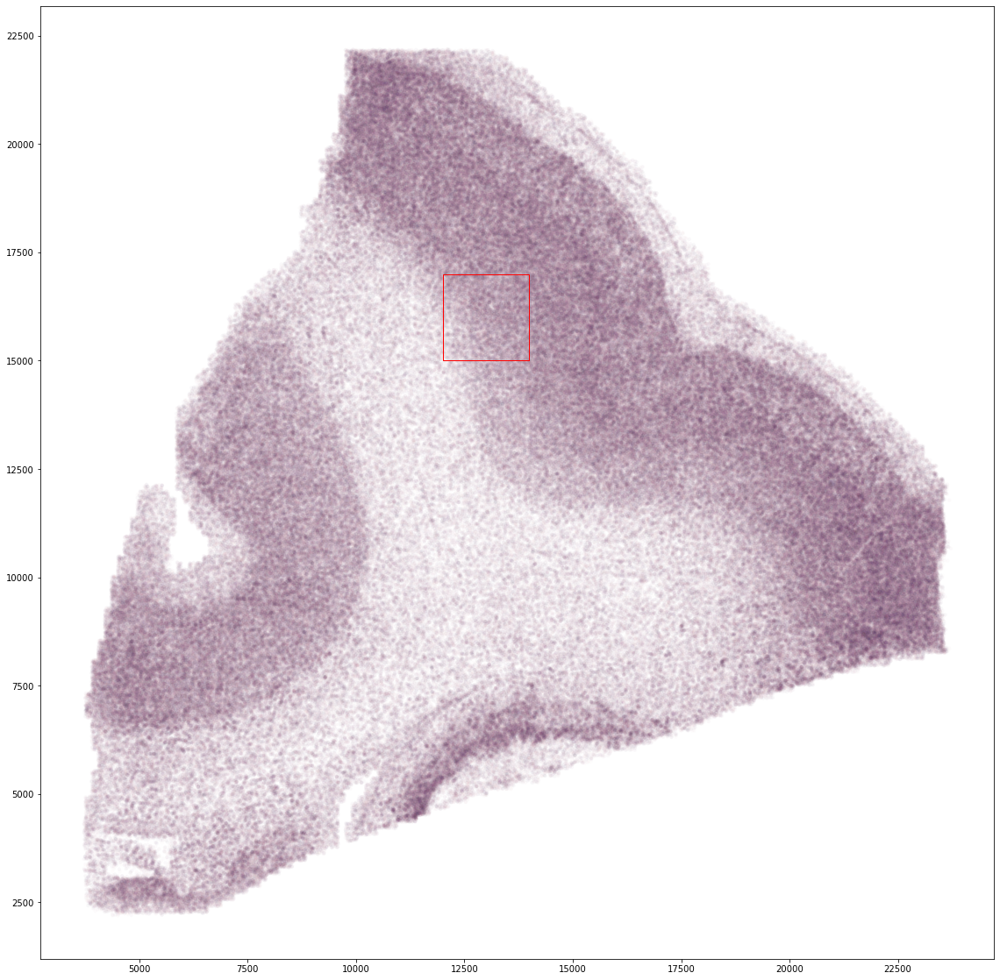

In [149]:
fig, ax = plt.subplots(figsize=(20, 20))
table[::100].scatter_plot(ax=ax, alpha=0.03)
sub.plot_rect(ax, 'r')

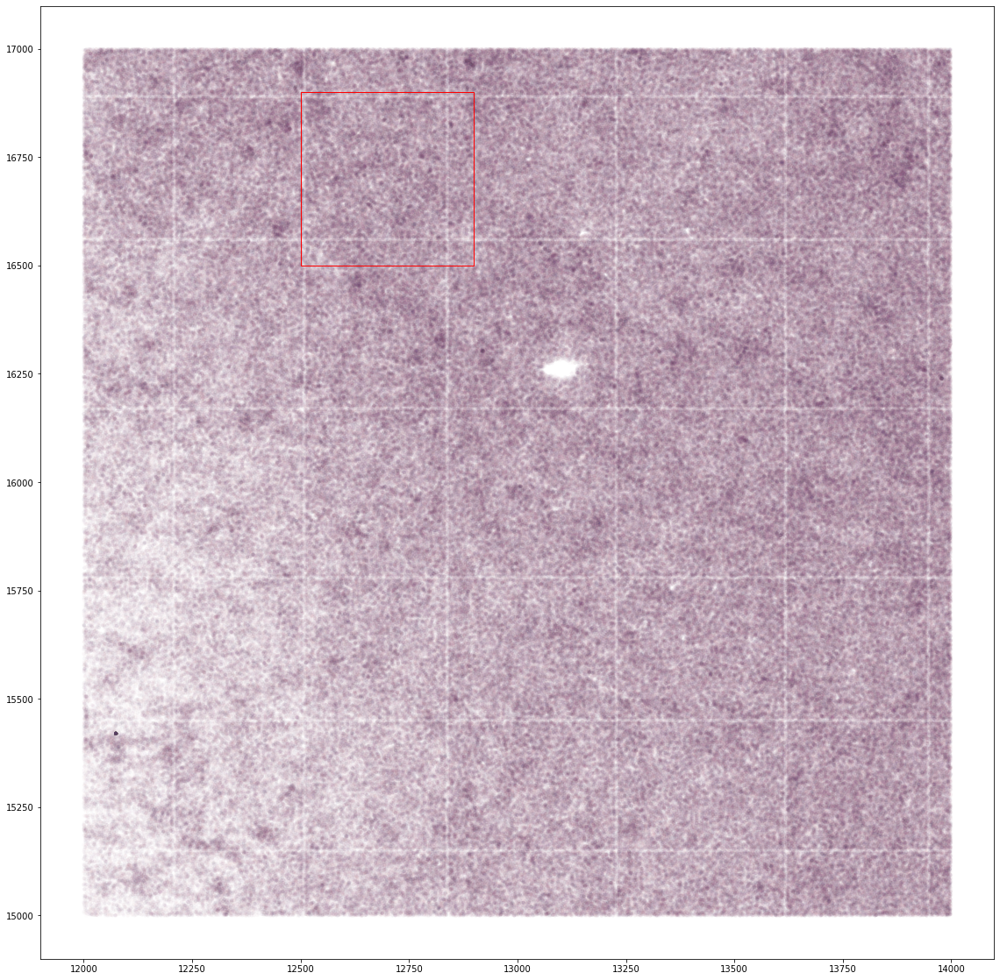

In [13]:
fig, ax = plt.subplots(figsize=(20, 20))
sub.scatter_plot(ax=ax, alpha=0.03)
sub2 = sub.get_subregion(xlim=(12500, 12900), ylim=(16500, 16900))
sub2.plot_rect(ax, 'r')

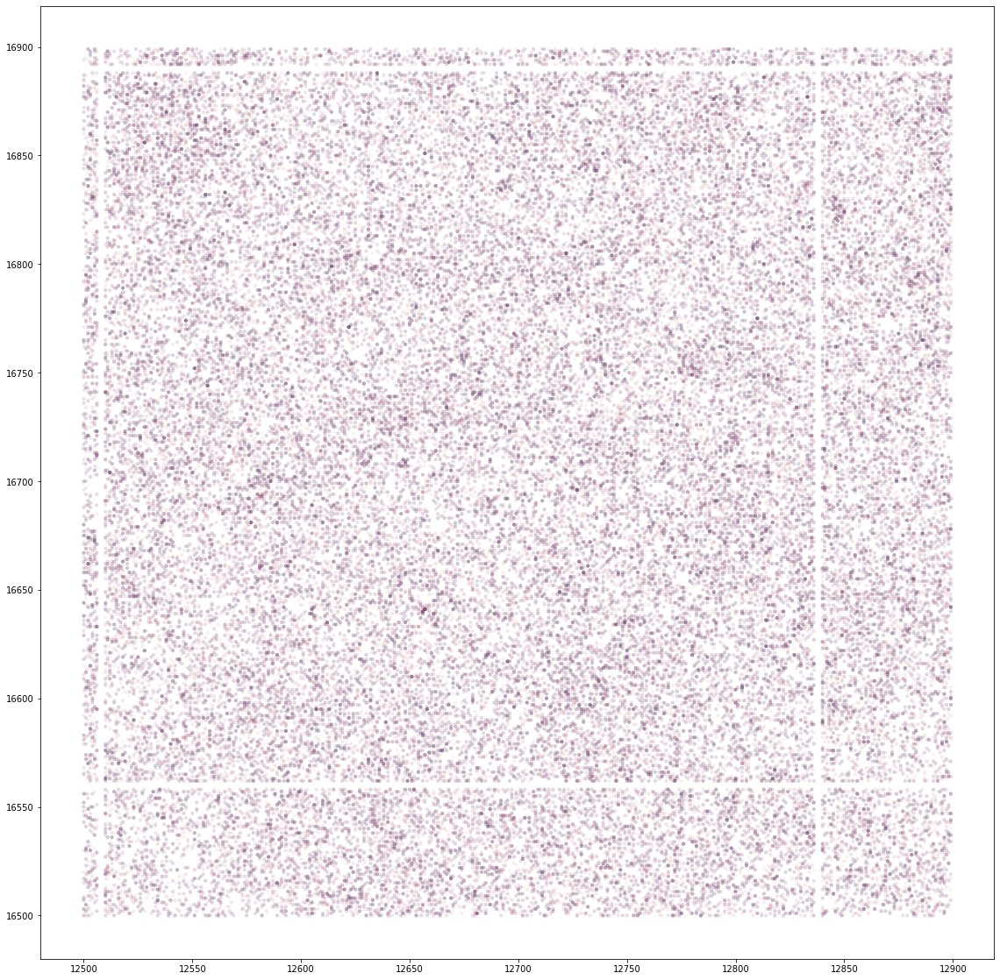

In [14]:


fig, ax = plt.subplots(figsize=(20, 20))
sub2.scatter_plot(ax=ax, alpha=0.2, color='gene')

Binning expression counts..


  0%|          | 0/40 [00:00<?, ?it/s]

Reducing binned expression counts..


C:\Users\stephanies\AppData\Local\Continuum\miniconda3\envs\py3\lib\site-packages\pkg_resources\__init__.py:123: PkgResourcesDeprecationWarning: 0.9.3-py3-e01ebd413f is an invalid version and will not be supported in a future release
  warnings.warn(
C:\Users\stephanies\AppData\Local\Continuum\miniconda3\envs\py3\lib\site-packages\pkg_resources\__init__.py:123: PkgResourcesDeprecationWarning: 0.9.3-py3-e01ebd413f is an invalid version and will not be supported in a future release
  warnings.warn(


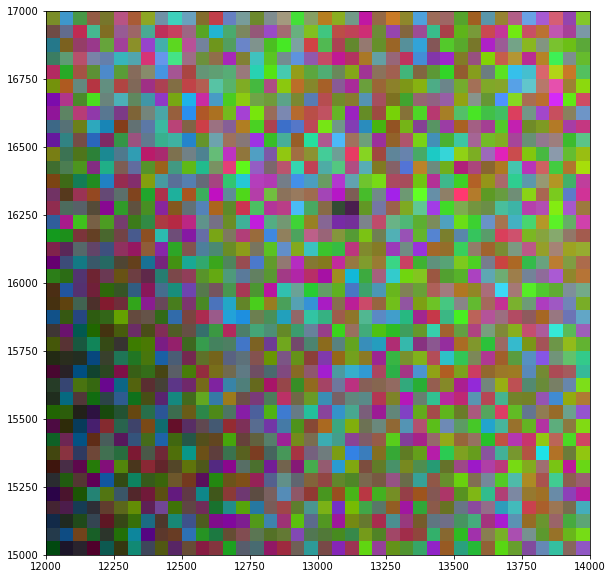

In [15]:
fig, ax = plt.subplots(figsize=(10, 10))
sub.reduced_expression_map(binsize=50, ax=ax, umap_args=dict(
    min_dist=0.4,
    n_neighbors=10,
    random_state=0,
));

Binning expression counts..


  0%|          | 0/102 [00:00<?, ?it/s]

Reducing binned expression counts..


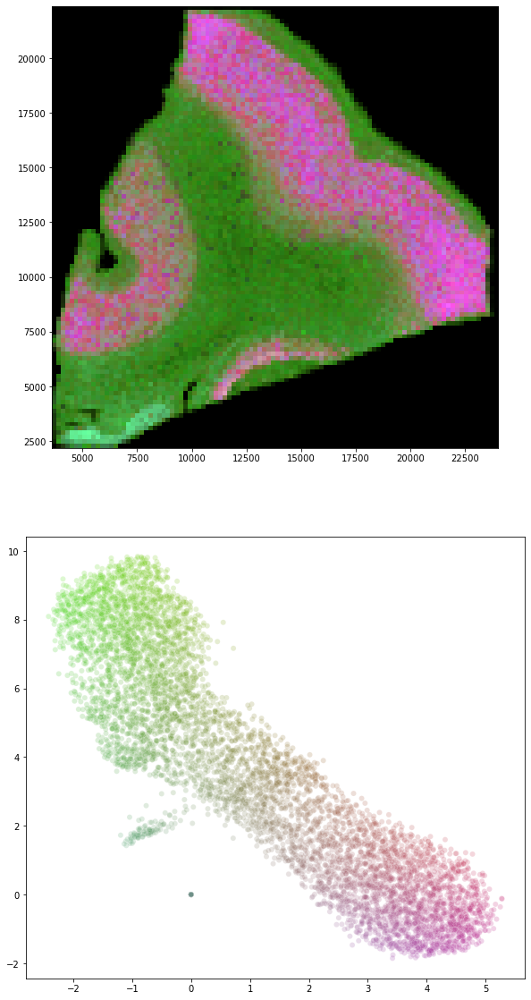

In [16]:
fig, ax = plt.subplots(2, 1, figsize=(10, 20))
table.reduced_expression_map(binsize=200, ax=ax[0], umap_ax=ax[1], umap_args=dict(
    min_dist=0.4,
    n_neighbors=10,
    random_state=0,
));

Binning expression counts..


  0%|          | 0/100 [00:00<?, ?it/s]

Reducing binned expression counts..


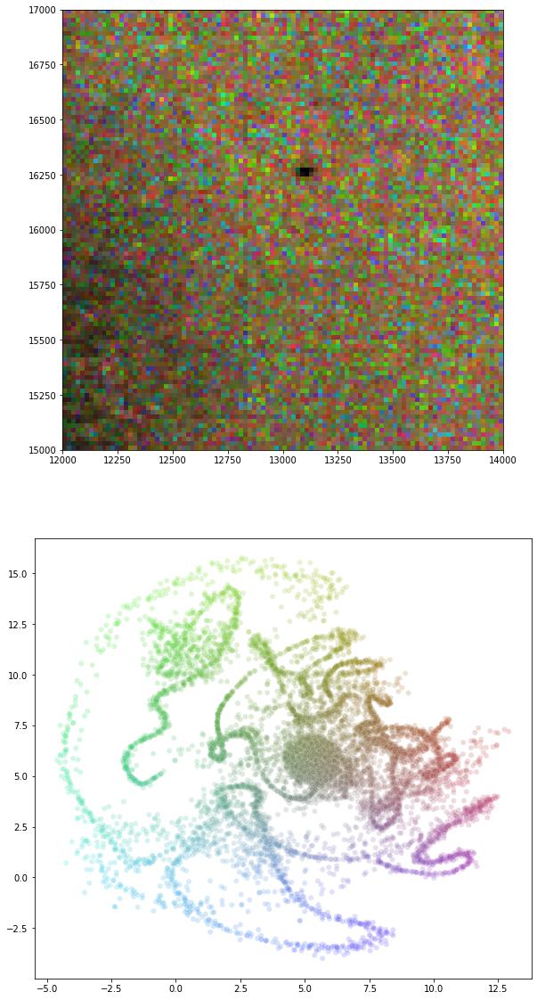

In [5]:
fig, ax = plt.subplots(2, 1, figsize=(10, 20))
# sub = table.get_subregion(xlim=(14000, 16000), ylim=(17000, 19000))
sub.reduced_expression_map(binsize=20, ax=ax[0], umap_ax=ax[1], umap_args=dict(
    min_dist=0.1,
    n_neighbors=3,
    random_state=0,
));

Binning expression counts..


  0%|          | 0/102 [00:00<?, ?it/s]

Reducing binned expression counts..


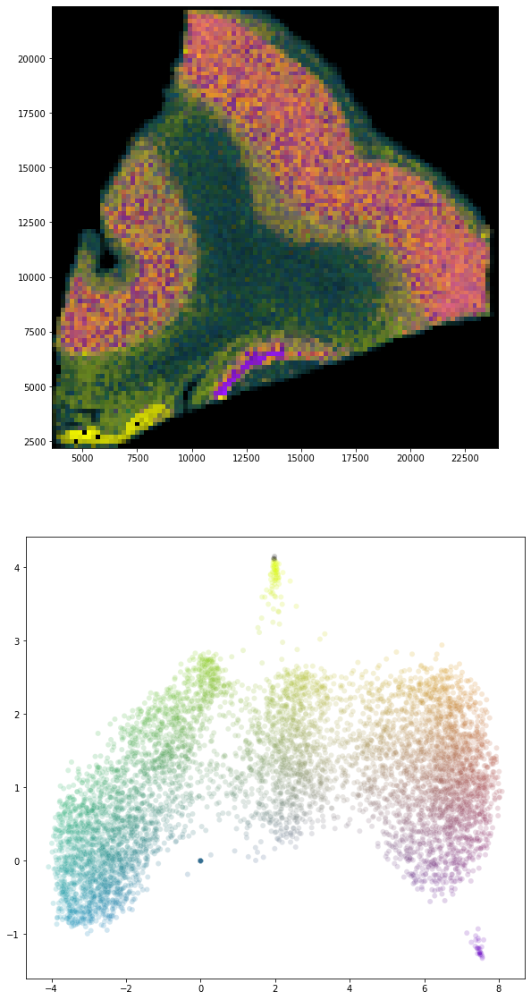

In [18]:
fig, ax = plt.subplots(2, 1, figsize=(10, 20))
table.reduced_expression_map(binsize=200, ax=ax[0], umap_ax=ax[1], umap_args=dict(
    min_dist=0.2,
    n_neighbors=5,
    random_state=0,
));

### Note: squiggles in UMAP are an indication that there is very little overlap in gene expression between bins

Binning expression counts..


  0%|          | 0/100 [00:00<?, ?it/s]

Reducing binned expression counts..


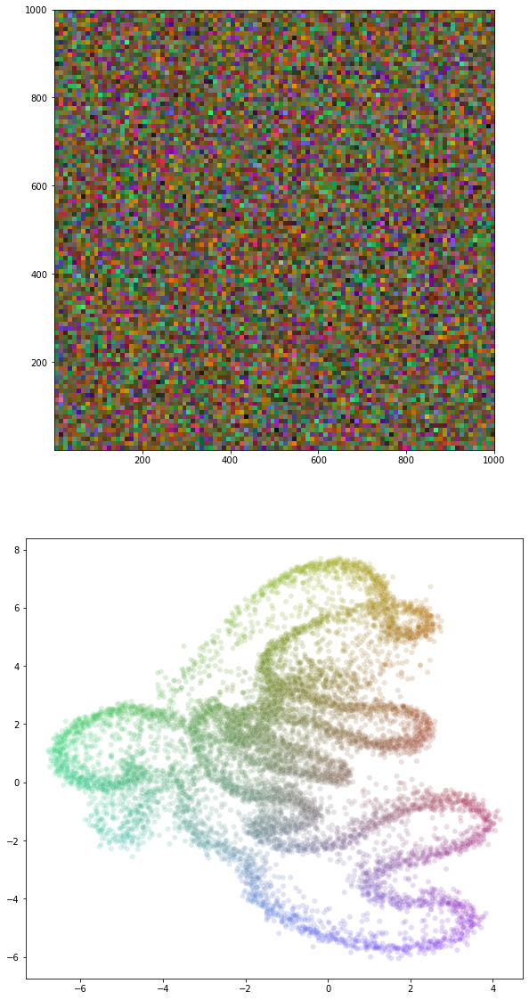

In [106]:
N = 100000
data = np.empty(N, dtype=[('x', float), ('y', float), ('gene', int)])
data['x'] = np.random.uniform(0, 1000, size=N)
data['y'] = np.random.uniform(0, 1000, size=N)
data['gene'] = np.random.randint(0, 10000, size=N)
test_table = SpotTable(data)

fig, ax = plt.subplots(2, 1, figsize=(10, 20))
test_table.reduced_expression_map(binsize=10, ax=ax[0], umap_ax=ax[1], umap_args=dict(
    min_dist=0.4,
    n_neighbors=10,
    random_state=0,
));

Load segmented data with cell IDs

In [26]:
data_path = '../../../data/BGI_data/cDNA5/'
data_file = data_path + 'sample_cDNAD5_bin100.tsv'
cache_file = data_file + '.npz'

if not os.path.exists(cache_file):
    print(f"Loading {data_file}..")

    dtype = [('gene', 'S20'), ('x', 'uint16'), ('y', 'uint16'), ('counts', 'ubyte'), ('cell', 'S30')]
    raw_data = np.loadtxt(data_file, skiprows=1, usecols=[0, 1, 2, 3, 4], delimiter='\t', dtype=dtype)

    # convert genes to int ID
    genes = np.unique(raw_data['gene'])
    gene_map = {gene:i for i, gene in enumerate(genes)}

    # convert cells to int ID
    cells = np.unique(raw_data['cell'])
    cell_map = {cell:i for i, cell in enumerate(cells)}
    
    data = np.empty(len(raw_data), dtype=[('gene', int), ('x', 'float32'), ('y', 'float32'), ('count', 'uint8'), ('cell', 'int32')])
    data['x'] = raw_data['x']
    data['y'] = raw_data['y']
    data['count'] = raw_data['counts']
    data['gene'] = [gene_map[g] for g in raw_data['gene']]    
    data['cell'] = [cell_map[c] for c in raw_data['cell']]    
    
    print("Recompressing to npz..")
    np.savez_compressed(cache_file, data=data, genes=genes, cells=cells)
else:
    print("Loading from cache..")
    items = np.load(cache_file)
    data = items['data']
    genes = items['genes']
    cells = items['cells']


Loading from cache..


In [21]:
cell_table = SpotTable(data, cell_ids=data['cell'])

Turns out spot locations are rounded to 100 um in this table, so we can't evaluate the quality of segmentation from here.. but we can export a cell x gene table:

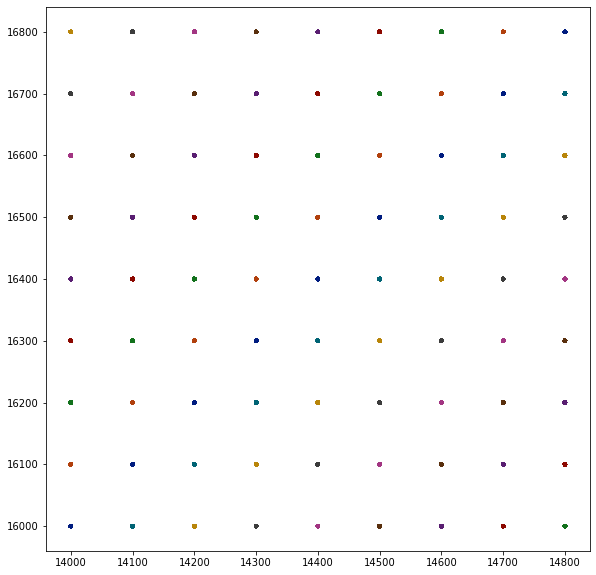

In [7]:
fig, ax = plt.subplots(figsize=(10, 10))
table.get_subregion(xlim=(14000, 14900), ylim=(16000, 16900)).cell_scatter_plot(ax=ax)

In [9]:
n_genes = len(genes)
n_cells = len(cells)

print(f"{n_genes} genes * {n_cells} cells = {n_genes * n_cells * 8 / 1e9} GB")

16036 genes * 24479 cells = 3.140361952 GB


In [10]:
dtype = [('cell', 'S30')] + [(gene.decode(), 'uint16') for gene in genes]
cell_gene_table = np.zeros(n_cells, dtype=dtype)
cell_gene_table['cell'] = cells
for row in data:
    cell_gene_table[row['cell']][genes[row['gene']].decode()] += row['count']

In [11]:
header = ','.join([field[0] for field in dtype])
fmt = ','.join(['%s'] + ['%d'] * len(genes))
with open(data_path + 'cell_gene_table.csv', 'w') as fh:
    fh.write(header + '\n')
    for row in cell_gene_table:
        fh.write(fmt % ((row[0].decode(),) + tuple(row)[1:]))
        fh.write('\n')

In [37]:
cell_map = {cell:i for i, cell in enumerate(cells)}
dtype = [('cell', 'S30'), ('x', 'float32'), ('y', 'float32')]
cell_gene_table_anno = np.empty(n_cells, dtype=dtype)
for cell in cells:
    cell_int = cell_map[cell]
    cell_gene_table_anno['cell'] = cell
    cell_gene_table_anno['x'] = np.unique(data[data['cell']==cell_int]['x'])[0]
    cell_gene_table_anno['y'] = np.unique(data[data['cell']==cell_int]['y'])[0]

In [42]:
cell

b'sample_cDNAD5:9900_9900'

In [11]:
header = ','.join([field[0] for field in dtype])
np.savetxt(data_path + 'cell_gene_table_anno.csv', cell_gene_table_anno, header=header)

Look at marker localization

In [156]:
gene_map = {gene:i for i, gene in enumerate(genes)}
rev_gene_map = {v:k for k, v in gene_map.items()}

In [160]:
gene_map['CUX2'.encode('utf-8')]

3301

In [151]:
def gene_mask(gene, gene_map, table):
    if isinstance(gene, list):
        gene = [g.encode('utf-8') for g in gene]
        gene_id = [gene_map[g] for g in gene]
        mask = np.isin(table.data['gene'], gene_id)
    else:
        gene = gene.encode('utf-8')
        gene_id = gene_map[gene]
        mask = table.data['gene']==gene_id
    gene_table = table[mask]
    return gene_table

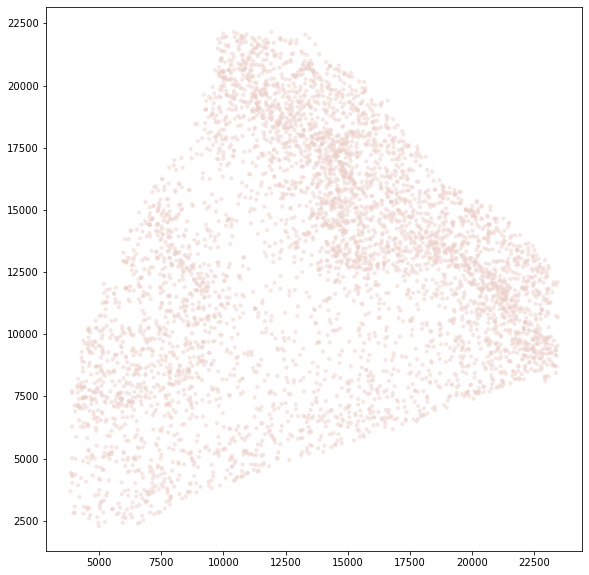

In [171]:
fig, ax = plt.subplots(figsize=(10, 10))
gene_mask('IL1RAPL2', gene_map, table).scatter_plot(ax=ax, alpha=0.5)

C:\Users\stephanies\AppData\Local\Continuum\miniconda3\envs\py3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


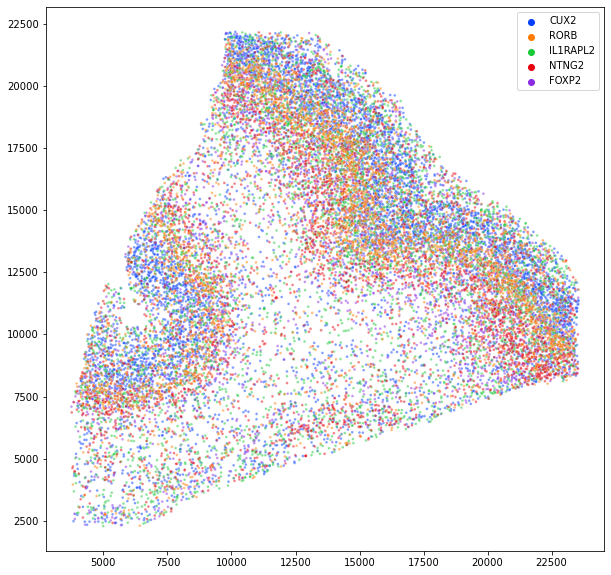

In [170]:
import seaborn as sns

gene_list = ['CUX2', 'RORB', 'IL1RAPL2', 'NTNG2', 'FOXP2']
gene_table = gene_mask(gene_list, gene_map, table)

fig, ax = plt.subplots(figsize=(10,10))
order = [gene_map[g.encode('utf-8')] for g in gene_list]
sns.scatterplot(gene_table.data['x'], gene_table.data['y'], hue=gene_table.data['gene'], palette='bright', hue_order=order, 
                alpha=0.5, s=7)
handles, labels  =  ax.get_legend_handles_labels()
ax.legend(handles, [rev_gene_map[int(label)].decode('utf-8') for label in labels])


C:\Users\stephanies\AppData\Local\Continuum\miniconda3\envs\py3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


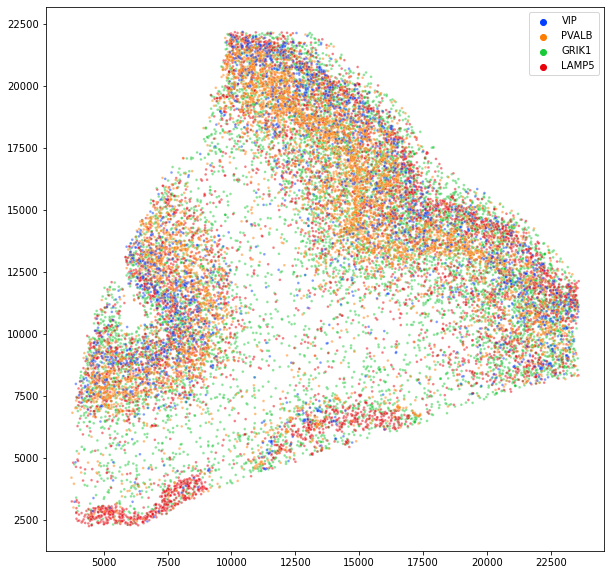

In [166]:
gene_list = ['VIP', 'PVALB', 'GRIK1', 'LAMP5']
gene_table = gene_mask(gene_list, gene_map, table)

fig, ax = plt.subplots(figsize=(10,10))
order = [gene_map[g.encode('utf-8')] for g in gene_list]
sns.scatterplot(gene_table.data['x'], gene_table.data['y'], hue=gene_table.data['gene'], palette='bright', hue_order=order, 
                alpha=0.5, s=7)
handles, labels  =  ax.get_legend_handles_labels()
ax.legend(handles, [rev_gene_map[int(label)].decode('utf-8') for label in labels])

C:\Users\stephanies\AppData\Local\Continuum\miniconda3\envs\py3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


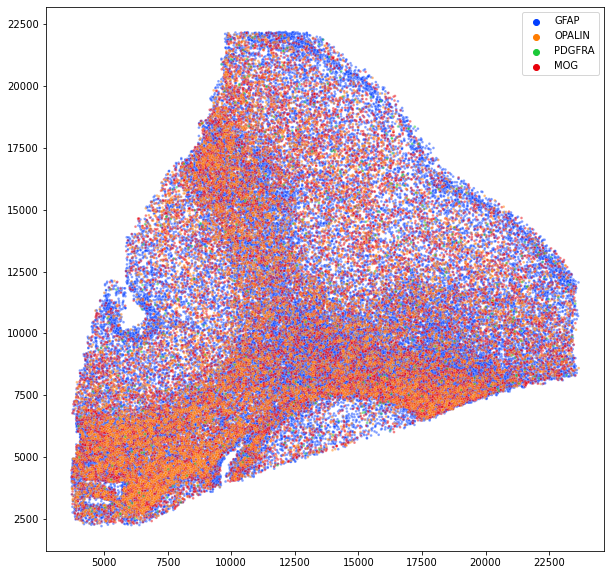

In [178]:
gene_list = ['GFAP', 'OPALIN', 'PDGFRA', 'MOG']
gene_table = gene_mask(gene_list, gene_map, table)

fig, ax = plt.subplots(figsize=(10,10))
order = [gene_map[g.encode('utf-8')] for g in gene_list]
sns.scatterplot(gene_table.data['x'], gene_table.data['y'], hue=gene_table.data['gene'], palette='bright', hue_order=order, 
                alpha=0.5, s=7)
handles, labels  =  ax.get_legend_handles_labels()
ax.legend(handles, [rev_gene_map[int(label)].decode('utf-8') for label in labels])

C:\Users\stephanies\AppData\Local\Continuum\miniconda3\envs\py3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


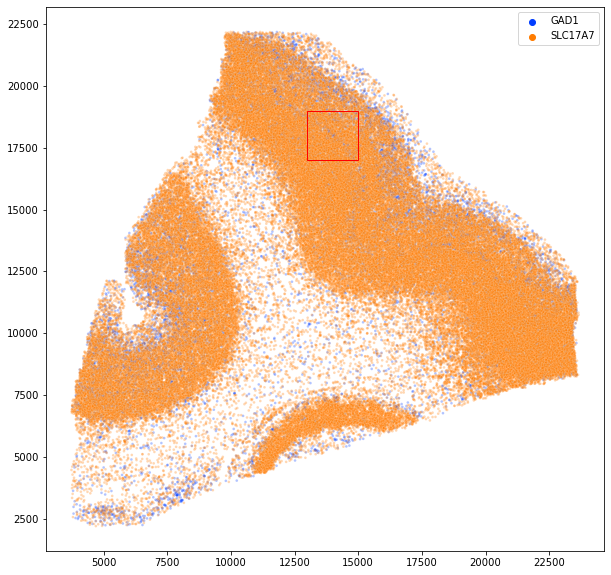

In [194]:
gene_list = ['GAD1', 'SLC17A7']
gene_table = gene_mask(gene_list, gene_map, table)
sub_gene = gene_table.get_subregion(xlim=(13000, 15000), ylim=(17000, 19000))

fig, ax = plt.subplots(figsize=(10,10))
order = [gene_map[g.encode('utf-8')] for g in gene_list]
sns.scatterplot(gene_table.data['x'], gene_table.data['y'], hue=gene_table.data['gene'], palette='bright', hue_order=order, 
                alpha=0.3, s=7, ax=ax)
handles, labels  =  ax.get_legend_handles_labels()
ax.legend(handles, [rev_gene_map[int(label)].decode('utf-8') for label in labels])
sub_gene.plot_rect(ax, 'r')

C:\Users\stephanies\AppData\Local\Continuum\miniconda3\envs\py3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


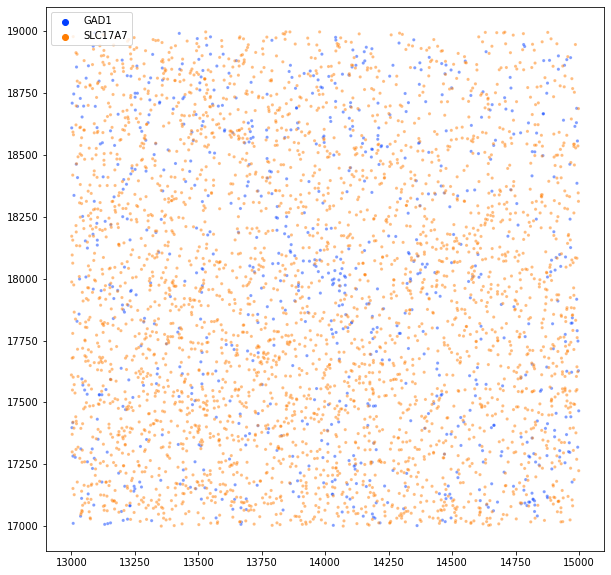

In [195]:
fig, ax = plt.subplots(figsize=(10,10))
sns.scatterplot(sub_gene.data['x'], sub_gene.data['y'], hue=sub_gene.data['gene'], palette='bright', hue_order=order, 
                alpha=0.5, s=10, ax=ax)
handles, labels  =  ax.get_legend_handles_labels()
ax.legend(handles, [rev_gene_map[int(label)].decode('utf-8') for label in labels])

In [36]:
cell_table.data

array([(    0,  6400.,  6200., 1, 19307),
       (    0,  4700., 10100., 1, 17484),
       (    0,  6500.,  3800., 1, 19406), ...,
       (16035, 12600., 19500., 2,  4745),
       (16035,  6900., 13100., 1, 19889),
       (16035,  7200., 14100., 2, 20302)],
      dtype=[('gene', '<i4'), ('x', '<f4'), ('y', '<f4'), ('count', 'u1'), ('cell', '<i4')])

In [100]:
row = cell_table.data[0]
row['gene']

0

In [4]:
bin50 = table.binned_expression_counts(binsize=50)

  0%|          | 0/405 [00:00<?, ?it/s]

In [9]:
bec, genes, gene_index, xrange, yrange = bin50

In [31]:
data

array([(    0,  6494.,  6281., 1), (    0,  4782., 10143., 1),
       (    0,  6582.,  3808., 1), ..., (16035, 12638., 19582., 2),
       (16035,  6974., 13122., 1), (16035,  7259., 14153., 2)],
      dtype=[('gene', '<i4'), ('x', '<f4'), ('y', '<f4'), ('count', 'u1')])

In [145]:
binsize=20
spacing=None

# x = data['x']
# y = data['y']
gene = data['gene']
spacing = spacing or binsize
padding = (binsize - spacing) / 2

xrange = 9000, 15000 #x.min(), x.max()
yrange = 14000, 22000 #y.min(), y.max()
gene_set = np.unique(gene)
gene_inds = {gene_set[i]:i for i in range(len(gene_set))} 

x_bins = int(np.ceil((xrange[1] - xrange[0]) / spacing))
y_bins = int(np.ceil((yrange[1] - yrange[0]) / spacing))
n_cells = (x_bins*y_bins)

# counts = np.zeros(shape, dtype='uint32')
dtype = [('cell', 'S30')] + [(gene.decode(), 'uint16') for gene in genes]
cell_by_gene = np.zeros(n_cells, dtype=dtype)
row = 0
for i in tqdm(range(x_bins)):
    xbin = (xrange[0] + i * spacing - padding), (xrange[0] + (i+1) * spacing + padding)
    xmask = (x > xbin[0]) & (x < xbin[1])
    y2 = y[xmask]
    g2 = gene[xmask]
    for j in range(y_bins):
        ybin = (yrange[0] + j * spacing - padding), (yrange[0] + (j+1) * spacing + padding)
        ymask = (y2 > ybin[0]) & (y2 < ybin[1])
        g3 = g2[ymask]
        cell_name = f'{xbin[0]} x {ybin[0]}'
        cell_by_gene[row]['cell'] = cell_name
        for g, c in zip(*np.unique(g3, return_counts=True)):
            cell_by_gene[row][genes[g].decode()] = c
        row += 1    

  0%|          | 0/300 [00:00<?, ?it/s]

In [144]:
header = ','.join([field[0] for field in dtype])
fmt = ','.join(['%s'] + ['%d'] * len(genes))
with open('../../../data/BGI_data/cDNA5/bin20_reduced.csv', 'w') as fh:
    fh.write(header + '\n')
    for row in cell_by_gene:
        fh.write(fmt % ((row[0].decode(),) + tuple(row)[1:]))
        fh.write('\n')